#### Imports

In [69]:
from optimizers import *
from functions import *
import numpy as np
import matplotlib.pyplot as plt

# A more complicated function

$$ N = 2, M = 3, F : \R^N \to \R^M$$

$$ F(x) = \begin{bmatrix}
    \sin(10 (x_1 + x_2)) + \cos(10 x_2) + 1 \\
    5\ln(1 + ||x||_2^2) - 5\exp(x_1 / 10) \\
   5\sin(x_1^2 - x_2^2)
\end{bmatrix}$$

In [70]:
N = 2
F1 = compose(sum_(N), mul_const(10), sin) + compose(proj(N)(0), mul_const(10), cos) + constN(N)(1)
F2 = compose(norm_sqr(N) + constN(N)(1), log, mul_const(5)) - compose(proj(N)(0), mul_const(1 / 10), exp, mul_const(5))
F3 = compose(compose(proj(N)(0), square) - compose(proj(N)(1), square), sin, mul_const(5))
F = stack(F1, F2, F3)

def f(x):
    return np.linalg.norm(F(x))

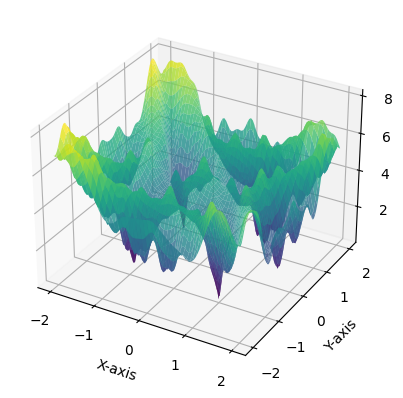

In [71]:
# Set up the plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')  # Use projection='3d' directly

# Generate data for x, y, and z
Xs = np.linspace(-2, 2, 100)
Ys = np.linspace(-2, 2, 100)

Xs, Ys = np.meshgrid(Xs, Ys)
Zs = np.array([[f(np.array([x, y])) for x, y in zip(xrow, yrow)] for xrow, yrow in zip(Xs, Ys)])

# Plot the surface
ax.plot_surface(Xs, Ys, Zs, cmap='viridis', alpha=0.8)

# Add labels and title
ax.set_xlabel('X-axis')
ax.set_ylabel('Y-axis')
ax.set_zlabel('Z-axis')
# ax.set_title('3D Plot of a Function')

# Display the plot (optional)
plt.show()

# Performance tests

Running Newton


Newton: 100%|██████████| 100/100 [00:00<00:00, 526.49it/s]


Running Gauss-Newton


Gauss-Newton: 100%|██████████| 100/100 [00:00<00:00, 1887.42it/s]


Running Gradient descent


Gradient descent: 100%|██████████| 100/100 [00:00<00:00, 1961.41it/s]


Running Levenberg-Marquardt


Levenberg-Marquardt: 100%|██████████| 100/100 [00:00<00:00, 1562.99it/s]


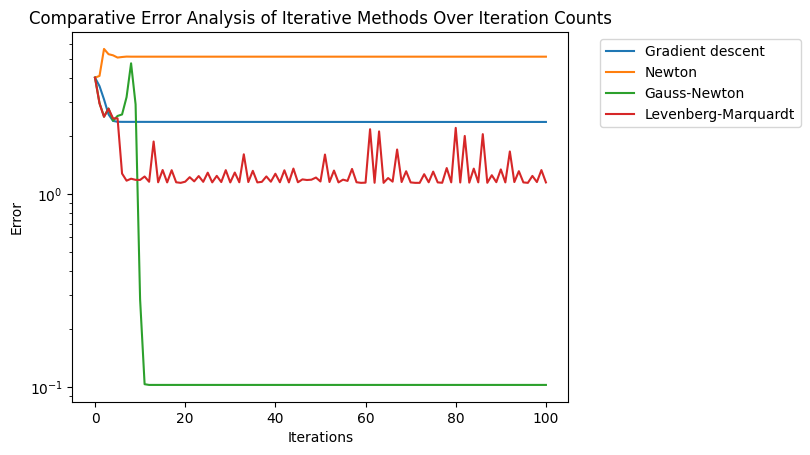

In [72]:
N = 2
max_iter = 100
np.random.seed(1)  # <- Gauss-Newton is a lot better than Newton
# np.random.seed(10)  # <- Newton is a lot better than Gauss-Newton
p0 = np.random.randn(N)
alpha_gd = 1e-3
alpha_gn = 1.0
lambda0 = 1.0
step_max_iter = 10
step_tol = 1e-6

NEWTON = "Newton"
GAUSS_NEWTON = "Gauss-Newton"
GRADIENT_DESCENT = "Gradient descent"
LEVENBERG_MARQUARDT_CONST_PARAM = "Levenberg-Marquardt"
optimizer_names = [
    GRADIENT_DESCENT,
    NEWTON,
    GAUSS_NEWTON,
    LEVENBERG_MARQUARDT_CONST_PARAM,
]

errors = {name: [] for name in optimizer_names}
points = {name: [] for name in optimizer_names}

optimizer_functions = {
    NEWTON: lambda points, errs: newton(R=F, p0=p0, max_iter=max_iter, alpha=alpha_gn, points=points, errs=errs),
    GAUSS_NEWTON: lambda points, errs: gauss_newton(R=F, p0=p0, alpha=alpha_gn, max_iter=max_iter, points=points, errs=errs),
    GRADIENT_DESCENT: lambda points, errs: gradient_descent(R=F, p0=p0, alpha=alpha_gd, max_iter=max_iter, points=points, errs=errs),
    LEVENBERG_MARQUARDT_CONST_PARAM: lambda points, errs: (
        LevenbergMarquardt(R=F, lambda_param_fun=LevenbergMarquardt.LambdaParamConstant(lambda0=lambda0))
        .optimize(p0, max_iter, step_type="cgnr", step_max_iter=step_max_iter, step_tol=step_tol, points=points, errs=errs)
    ),
}

for name, optimizer in optimizer_functions.items():
    print("Running " + name)
    optimizer(points=points[name], errs=errors[name])

iters = np.arange(0, max_iter + 1)
for label, err in errors.items():
    try:
        plt.plot(iters, err, label=label)
    except:
        print("error in plotting for " + label)

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xlabel("Iterations")
plt.ylabel("Error")
plt.yscale("log")
plt.title("Comparative Error Analysis of Iterative Methods Over Iteration Counts")
plt.show()

In [73]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

def normF(x: np.ndarray) -> np.float64:
    return np.linalg.norm(F(x))**2

def animate(name, num_iters):
    def update(frame, data, line):
        scatter = ax.scatter(data[frame, 0], data[frame, 1], normF(data[frame]), c='r', marker='o')
        line = ax.plot(data[:frame+1, 0], data[:frame+1, 1], np.array([normF(x) for x in data[:frame+1]]), 'b-')[0]
        ax.set_title(f"{name} at iteration {frame} with value {normF(data[frame]):.4f}")
        return scatter, line

    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')

    trajectory = np.array(points[name])[:num_iters]

    Xs = np.linspace(min(trajectory[:, 0]) - abs(min(trajectory[:, 0])) * 0.2 - 0.1, max(trajectory[:, 0]) + abs(max(trajectory[:, 0])) * 0.2 + 0.1, 100)
    Ys = np.linspace(min(trajectory[:, 1]) - abs(min(trajectory[:, 1])) * 0.2 - 0.1, max(trajectory[:, 1]) + abs(max(trajectory[:, 1])) * 0.2 + 0.1, 100)

    Xs, Ys = np.meshgrid(Xs, Ys)
    Zs = np.array([[normF(np.array([x, y])) for x, y in zip(xrow, yrow)] for xrow, yrow in zip(Xs, Ys)])

    ax.plot_surface(Xs, Ys, Zs, cmap='viridis', alpha=0.8)

    ax.set_xlabel('X-axis')
    ax.set_ylabel('Y-axis')
    ax.set_zlabel('Z-axis')


    line = ax.plot([], [], [], 'b')[0]

    ani = FuncAnimation(fig, update, frames=num_iters, fargs=(trajectory, line), blit=True)

    # save as gif
    # ani.save(f'{name}.gif', fps=4)

    display(HTML(ani.to_jshtml()))


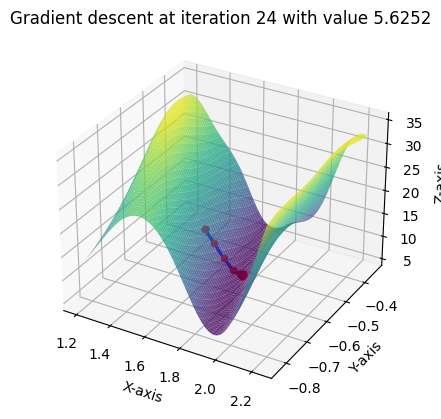

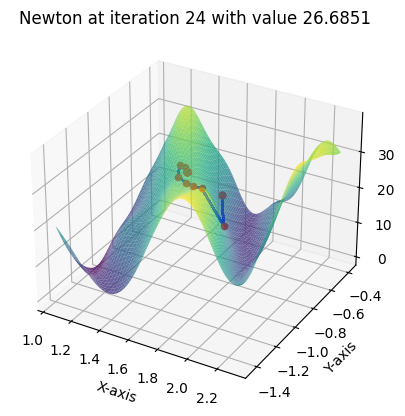

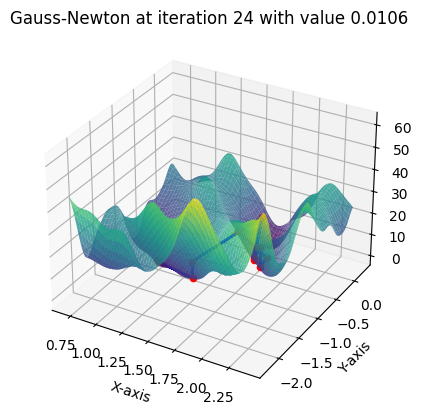

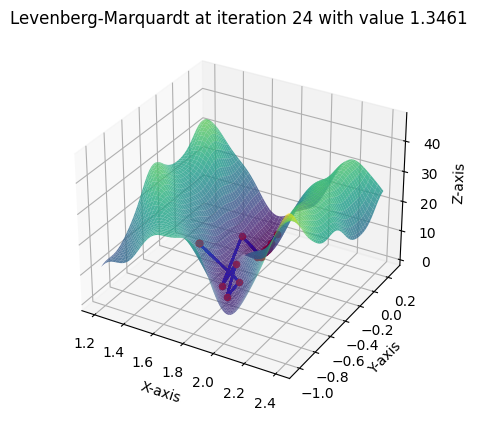

In [74]:
num_iters = 25
for name in optimizer_names:
    animate(name, num_iters)